# **Data Anlysis**

## **Load Data**

In [17]:
import pandas as pd
data = pd.read_csv('data.csv')
data['departure_time'] = pd.to_datetime(data['departure_time'])
data['arrival_time'] = pd.to_datetime(data['arrival_time'])

In [18]:
data

,callsign,departure_airport,arrival_airport,departure_time,arrival_time,after_7_10_2023,before_7_10_2023,departure_time_month,departure_time_day,departure_time_hour,departure_time_minute,departure_time_day_name,departure_time_day_of_week,airportName,latitude_deg,longitude_deg,continent,country_code,municipality,country_name
0,ELY363,LLBG,LOWW,2023-10-12 17:24:41,2023-10-12 20:46:46,1,0,10,12,17,24,Thursday,3,Vienna International Airport,48.1103,16.56970,Europe,AT,Vienna,Austria
1,ELY363,LLBG,LOWW,2023-10-12 17:24:41,2023-10-12 20:46:46,1,0,10,12,17,24,Thursday,3,Vienna International Airport,48.1103,16.56970,North America,AT,Vienna,Austria
2,ELY363,LLBG,LOWW,2023-10-12 17:24:41,2023-10-12 20:46:46,1,0,10,12,17,24,Thursday,3,Vienna International Airport,48.1103,16.56970,North America,AT,Vienna,Austria
3,ELY363,LLBG,LOWW,2023-10-12 17:24:41,2023-10-12 20:46:46,1,0,10,12,17,24,Thursday,3,Vienna International Airport,48.1103,16.56970,North America,AT,Vienna,Austria
4,ELY397,LLBG,LEMD,2023-10-12 16:44:30,2023-10-12 21:22:30,1,0,10,12,16,44,Thursday,3,Madrid Barajas International Airport,40.4936,-3.56676,Europe,ES,Madrid,Spain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150740,ELY395,LLBG,LEMD,2023-10-06 02:18:41,2023-10-06 06:59:56,0,1,10,6,2,18,Friday,4,Madrid Barajas International Airport,40.4936,-3.56676,Asia,ES,Madrid,Spain
150741,DLH691,LLBG,EDDF,2023-10-06 02:11:34,2023-10-06 06:25:45,0,1,10,6,2,11,Friday,4,Frankfurt am Main International Airport,50.0264,8.54313,Europe,DE,Frankfurt am Main,Germany
150742,KLM462,LLBG,EHAM,2023-10-06 02:04:54,2023-10-06 06:32:57,0,1,10,6,2,4,Friday,4,Amsterdam Airport Schiphol,52.3086,4.76389,Europe,NL,Amsterdam,Netherlands
150743,KLM462,LLBG,EHAM,2023-10-06 02:04:54,2023-10-06 06:32:57,0,1,10,6,2,4,Friday,4,Amsterdam Airport Schiphol,52.3086,4.76389,North America,NL,Amsterdam,Netherlands


In [19]:
data.isnull().sum()

,0
callsign,0
departure_airport,0
arrival_airport,0
departure_time,0
arrival_time,0
after_7_10_2023,0
before_7_10_2023,0
departure_time_month,0
departure_time_day,0
departure_time_hour,0


In [20]:
# Drop na
data = data.dropna()
data.isna().sum()

,0
callsign,0
departure_airport,0
arrival_airport,0
departure_time,0
arrival_time,0
after_7_10_2023,0
before_7_10_2023,0
departure_time_month,0
departure_time_day,0
departure_time_hour,0


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 150460 entries, 0 to 150744
Data columns (total 20 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   callsign                    150460 non-null  object        
 1   departure_airport           150460 non-null  object        
 2   arrival_airport             150460 non-null  object        
 3   departure_time              150460 non-null  datetime64[ns]
 4   arrival_time                150460 non-null  datetime64[ns]
 5   after_7_10_2023             150460 non-null  int64         
 6   before_7_10_2023            150460 non-null  int64         
 7   departure_time_month        150460 non-null  int64         
 8   departure_time_day          150460 non-null  int64         
 9   departure_time_hour         150460 non-null  int64         
 10  departure_time_minute       150460 non-null  int64         
 11  departure_time_day_name     150460 non-null 

In [22]:
!pip install ydata-profiling

In [23]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
df = data.copy()

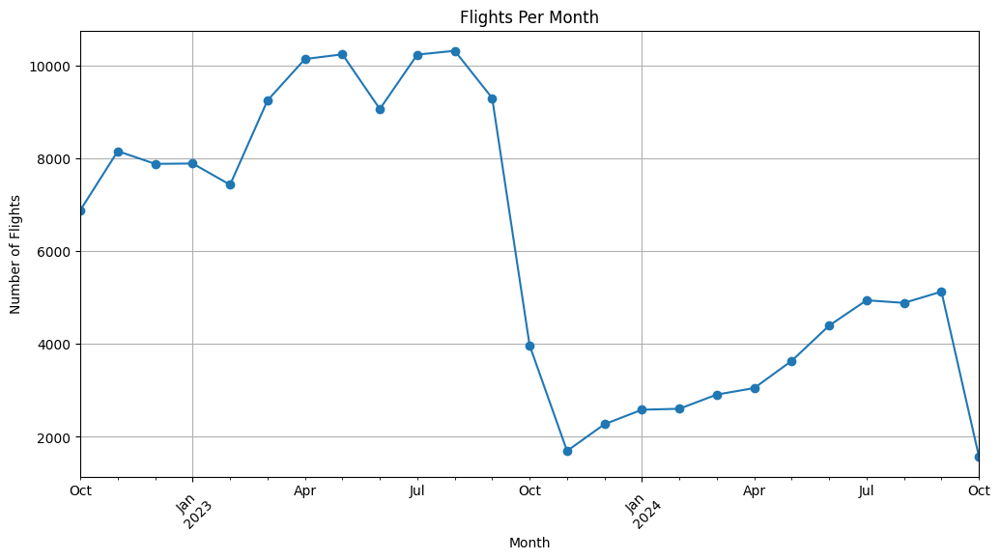

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by month
flights_per_month = df.groupby(df["departure_time"].dt.to_period("M")).size()

# Plot
plt.figure(figsize=(12, 6))
flights_per_month.plot(marker='o', linestyle='-')
plt.title("Flights Per Month")
plt.xlabel("Month")
plt.ylabel("Number of Flights")
plt.xticks(rotation=45)
plt.grid()
plt.show()

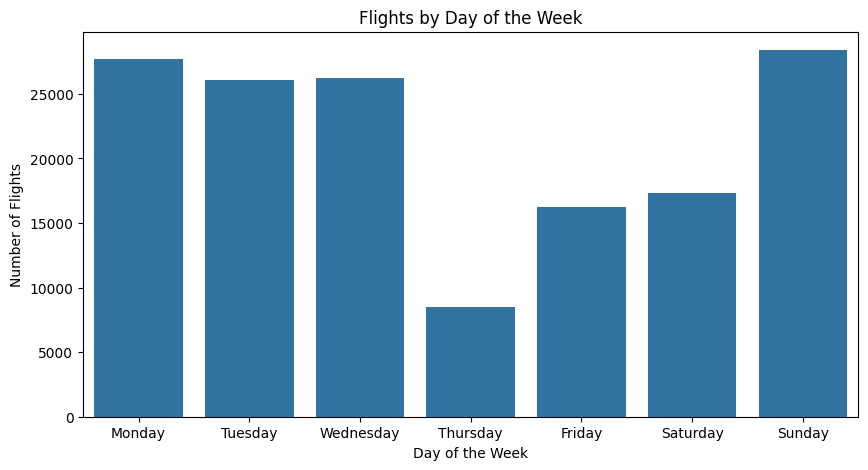

In [26]:
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.countplot(x=df["departure_time_day_name"], order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.title("Flights by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Flights")
plt.show()

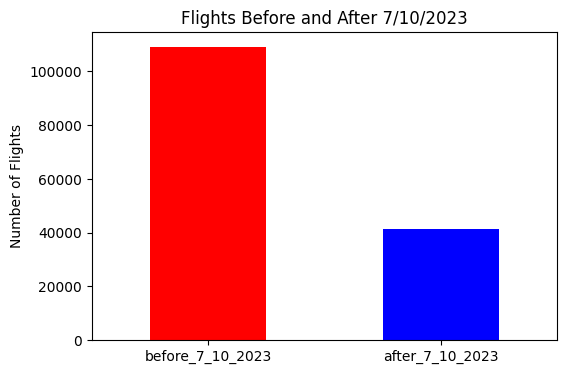

In [27]:
df_grouped = df[["before_7_10_2023", "after_7_10_2023"]].sum()

plt.figure(figsize=(6, 4))
df_grouped.plot(kind="bar", color=["red", "blue"])
plt.title("Flights Before and After 7/10/2023")
plt.ylabel("Number of Flights")
plt.xticks(rotation=0)
plt.show()


In [28]:
import plotly.express as px

fig = px.scatter_geo(df,
                     lat="latitude_deg", lon="longitude_deg",
                     hover_name="municipality",
                     title="Flight Routes")
fig.show()


In [33]:
# Classify flights into before/after October 7
df['period'] = df['after_7_10_2023'].apply(lambda x: 'Before' if x == 1 else 'After')

<Figure size 1000x500 with 0 Axes>

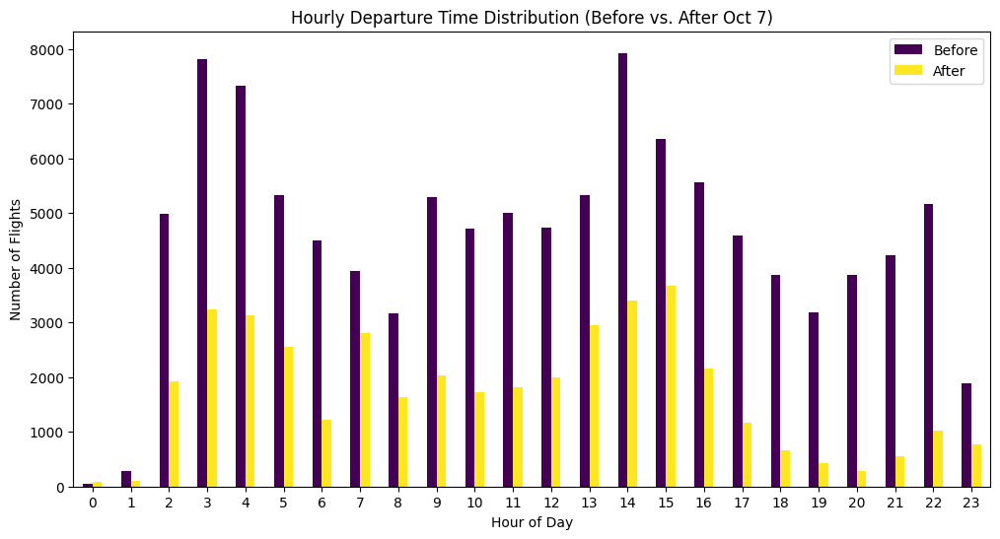

In [34]:
# Count flights per hour before and after
hourly_flights = df.groupby(['departure_time_hour', 'period']).size().unstack().fillna(0)

# Plot
plt.figure(figsize=(10,5))
hourly_flights.plot(kind='bar', figsize=(12,6), colormap='viridis')
plt.title("Hourly Departure Time Distribution (Before vs. After Oct 7)")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Flights")
plt.legend(["Before", "After"])
plt.xticks(rotation=0)
plt.show()

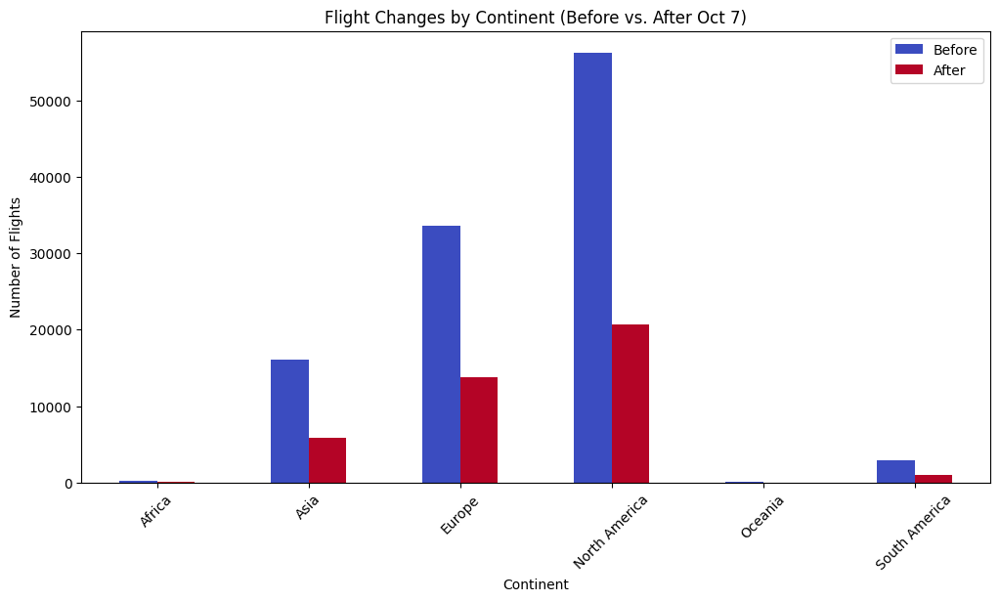

In [35]:
# Count flights per continent before & after
continent_flights = df.groupby(['continent', 'period']).size().unstack().fillna(0)

# Bar chart
continent_flights.plot(kind='bar', figsize=(12,6), colormap='coolwarm')
plt.title("Flight Changes by Continent (Before vs. After Oct 7)")
plt.xlabel("Continent")
plt.ylabel("Number of Flights")
plt.legend(["Before", "After"])
plt.xticks(rotation=45)
plt.show()